# HOMEWORK3: JOSUÉ CHUMPITAZI

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import geopandas as gpd
from geopandas import GeoSeries
from shapely.geometry import Point, LineString
import os


In [2]:
gtwd = os.getcwd()
print(gtwd)

d:\Downloads\PYTHON\High-School-Access-Peru


In [3]:
#Shapefile
dpt_shp = gpd.read_file(r'd:\Downloads\PYTHON\High-School-Access-Peru\DISTRITOS.shp')

print(dpt_shp.columns)

Index(['IDDPTO', 'DEPARTAMEN', 'IDPROV', 'PROVINCIA', 'IDDIST', 'DISTRITO',
       'CAPITAL', 'CODCCPP', 'AREA', 'FUENTE', 'geometry'],
      dtype='object')


In [4]:
# Mostrar las primeras filas del Geodataframe
print(dpt_shp.head())

  IDDPTO DEPARTAMEN IDPROV    PROVINCIA  IDDIST                DISTRITO  \
0     10    HUANUCO   1009  PUERTO INCA  100902         CODO DEL POZUZO   
1     10    HUANUCO   1009  PUERTO INCA  100904             TOURNAVISTA   
2     25    UCAYALI   2503   PADRE ABAD  250305  ALEXANDER VON HUMBOLDT   
3     25    UCAYALI   2503   PADRE ABAD  250302                 IRAZOLA   
4     25    UCAYALI   2503   PADRE ABAD  250304                 NESHUYA   

                  CAPITAL CODCCPP  AREA FUENTE  \
0         CODO DEL POZUZO    0001     1   INEI   
1             TOURNAVISTA    0001     1   INEI   
2  ALEXANDER VON HUMBOLDT    0001     1   INEI   
3           SAN ALEJANDRO    0001     1   INEI   
4            MONTE ALEGRE    0001     1   INEI   

                                            geometry  
0  POLYGON ((-75.31797 -9.29529, -75.3171 -9.2975...  
1  POLYGON ((-74.64136 -8.82302, -74.64036 -8.828...  
2  POLYGON ((-75.02253 -8.74193, -75.02267 -8.742...  
3  POLYGON ((-75.13864 -8.56

In [5]:
#Coordinate Reference System
dpt_shp.crs


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [6]:
final_df = pd.read_excel(r'd:\Downloads\PYTHON\High-School-Access-Peru\archivo_final.xlsx')
print(final_df.head())


   Código Modular  Anexo     Nombre de SS.EE.  Ubigeo Departamento Provincia  \
0         3947725      0  SEMILLITAS DE JESUS   20101       ANCASH    HUARAZ   
1          723718      0                420-3   20101       ANCASH    HUARAZ   
2         1406321      0        MAGNUS SCHOOL   20101       ANCASH    HUARAZ   
3         1344944      0        MAGNUS SCHOOL   20101       ANCASH    HUARAZ   
4         1310309      0          SANTA ELENA   20101       ANCASH    HUARAZ   

  Distrito  Código DRE/UGEL DRE / UGEL    Centro Poblado  \
0   HUARAZ            20001     HUARAZ    8 DE DICIEMBRE   
1   HUARAZ            20001     HUARAZ  ANTONIO RAIMONDI   
2   HUARAZ            20001     HUARAZ             BELEN   
3   HUARAZ            20001     HUARAZ             BELEN   
4   HUARAZ            20001     HUARAZ             BELEN   

   Código Centro Poblado  Código Local                            Dirección  \
0               655321.0           NaN                       PIEDRAS AZULES   


In [7]:
columnas = [
    "Código Modular",
    "Nombre de SS.EE.",
    "Ubigeo",
    "Departamento",
    "Provincia",
    "Distrito",
    "Centro Poblado",
    "Nivel / Modalidad",
    "Gestion / Dependencia"
]
final_df = final_df[columnas]

In [ ]:


gdf_schools = pd.DataFrame(final_df).copy()

#Renombrar varias columnas en una sola línea
gdf_schools = gdf_schools.rename(columns={
    "Distrito": "DISTRITO",
    "Ubigeo": "IDDIST"
})

print(gdf_schools.columns)


Index(['Código Modular', 'Nombre de SS.EE.', 'IDDIST', 'Departamento',
       'Provincia', 'DISTRITO', 'Centro Poblado', 'Nivel / Modalidad',
       'Gestion / Dependencia'],
      dtype='object')


In [9]:
print(gdf_schools['Gestion / Dependencia'].unique())
print('----------------')
print(gdf_schools['Nivel / Modalidad'].unique())

['Pública - Sector Educación' 'Privada - Particular'
 'Pública - En convenio' 'Privada - Parroquial'
 'Privada - Instituciones Benéficas' 'Pública - Municipalidad'
 'Pública - Otro Sector Público' 'Privada - Comunal'
 'Privada - Cooperativa' 'Privada - Fiscalizada']
----------------
['Inicial No Escolarizado' 'Inicial - Jardín' 'Primaria'
 'Inicial - Cuna Jardín' 'Superior Tecnológica' 'Secundaria'
 'Técnico Productiva - CETPRO' 'Instancia de Apoyo'
 'Superior Formación Artística' 'Básica Alternativa - Avanzado'
 'Básica Alternativa - Inicial e Intermedio' 'Básica Especial - Primaria'
 'Básica Especial - Inicial' 'Básica Especial - PRITE'
 'Superior Pedagógica' 'Escuela Superior Pedagógica' 'Inicial - Cuna'
 'Escuela Superior Tecnológica']


In [10]:
gdf_schools["DISTRITO"] = gdf_schools["DISTRITO"].str.upper()
dpt_shp["DISTRITO"] = dpt_shp["DISTRITO"].str.upper()
print(len(gdf_schools['IDDIST'].unique()))
print(len(dpt_shp['DISTRITO'].unique()))
print(len(dpt_shp['IDDIST'].unique()))

1891
1721
1873


In [ ]:
print("Tipo de IDDIST en gdf_schools:", gdf_schools['IDDIST'].dtype)
print("Tipo de IDDIST en dpt_shp:", dpt_shp['IDDIST'].dtype)

#Convertir la columna numérica a texto (str)
gdf_schools['IDDIST'] = gdf_schools['IDDIST'].astype(int)
dpt_shp['IDDIST'] = dpt_shp['IDDIST'].astype(int)
print("Tipo de IDDIST en gdf_schools después de convertirse:", gdf_schools['IDDIST'].dtype)

Tipo de IDDIST en gdf_schools: int64
Tipo de IDDIST en dpt_shp: object
Tipo de IDDIST en gdf_schools después de convertirse: int64


In [12]:
#Hacer un mergue por cantidad de colegio segun su ID_distrito:  Primero calculamos la cantidad luego el mergue

dt_inicial = gdf_schools[gdf_schools['Nivel / Modalidad'].str.contains('Inicial', case=False)]
dt_primaria = gdf_schools[gdf_schools['Nivel / Modalidad'].str.contains('Primaria', case=False)]
dt_secundaria = gdf_schools[gdf_schools['Nivel / Modalidad'].str.contains('Secundaria', case=False)]

In [13]:
# Merge para obtener la geometría de los distritos
cantidad_primaria = dt_primaria.groupby('IDDIST').size().reset_index(name='NumEscuelas')
cantidad_inicial = dt_inicial.groupby('IDDIST').size().reset_index(name='NumEscuelas')
cantidad_secundaria = dt_secundaria.groupby('IDDIST').size().reset_index(name='NumEscuelas')



In [14]:
dpt_primaria = dpt_shp.merge(
    cantidad_primaria,
    on='IDDIST',
    how='left'
).fillna({'NumEscuelas': 0})

dpt_inicial = dpt_shp.merge(
    cantidad_inicial,
    on='IDDIST',
    how='left'
).fillna({'NumEscuelas': 0})

dpt_secundaria = dpt_shp.merge(
    cantidad_secundaria,
    on='IDDIST',
    how='left'
).fillna({'NumEscuelas': 0})




### NIVEL INICIAL: FIGURA

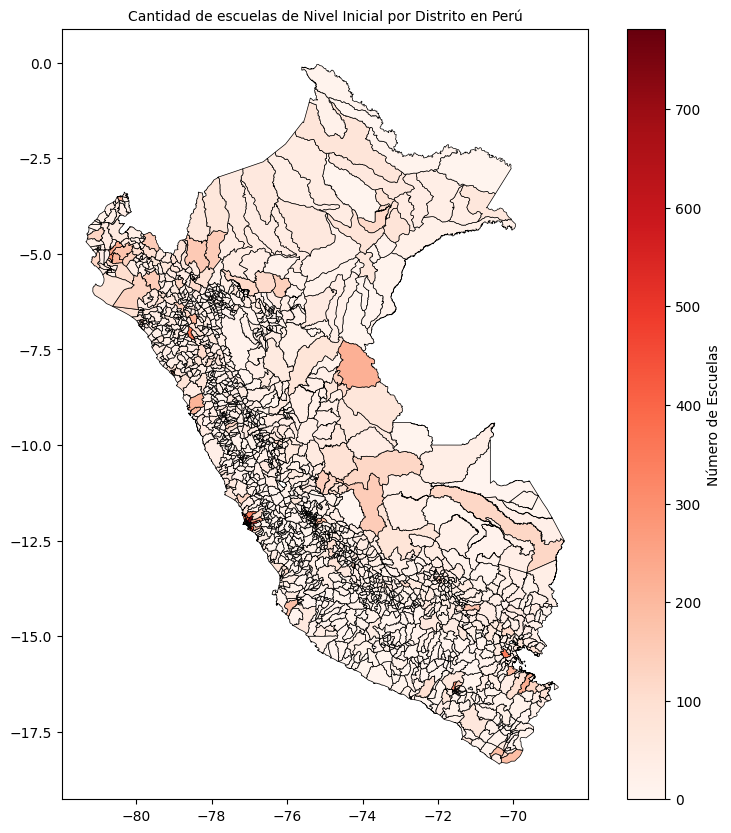

In [15]:
fig, ax = plt.subplots(figsize=(10, 10))

dpt_inicial.plot(
    column='NumEscuelas',
    cmap='Reds',
    ax=ax,
    legend=True,
    edgecolor='black',
    linewidth=0.5,
    legend_kwds={'label': "Número de Escuelas"}
)

plt.title('Cantidad de escuelas de Nivel Inicial por Distrito en Perú', fontsize=10)
plt.show()

### NIVEL PRIMARIA: FIGURA

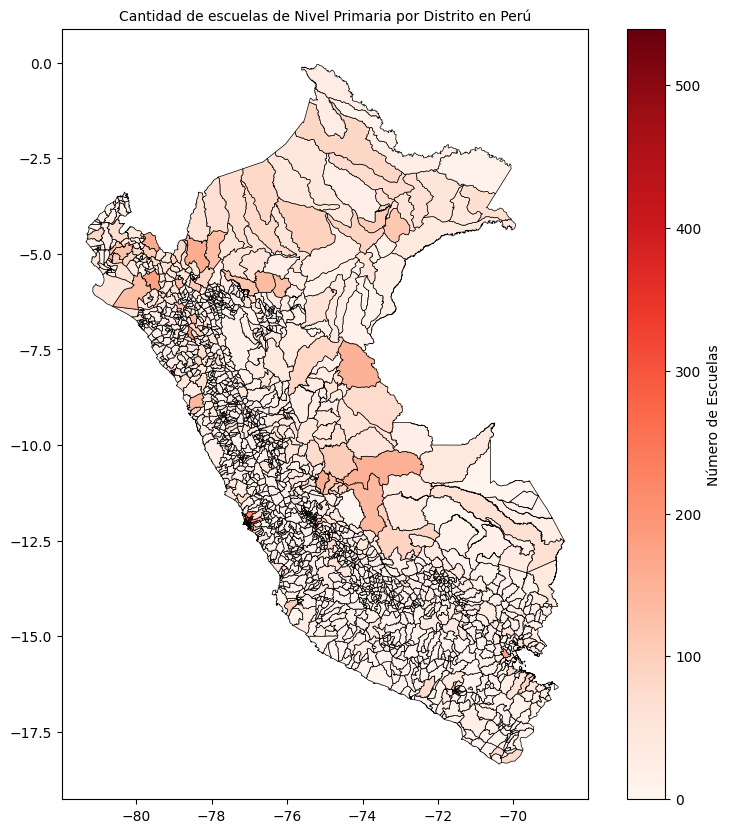

In [16]:
fig, ax = plt.subplots(figsize=(10, 10))

dpt_primaria.plot(
    column='NumEscuelas',
    cmap='Reds',
    ax=ax,
    legend=True,
    edgecolor='black',
    linewidth=0.5,
    legend_kwds={'label': "Número de Escuelas"}
)

plt.title('Cantidad de escuelas de Nivel Primaria por Distrito en Perú', fontsize=10)
plt.show()

### NIVEL SECUNDARIA: FIGURA

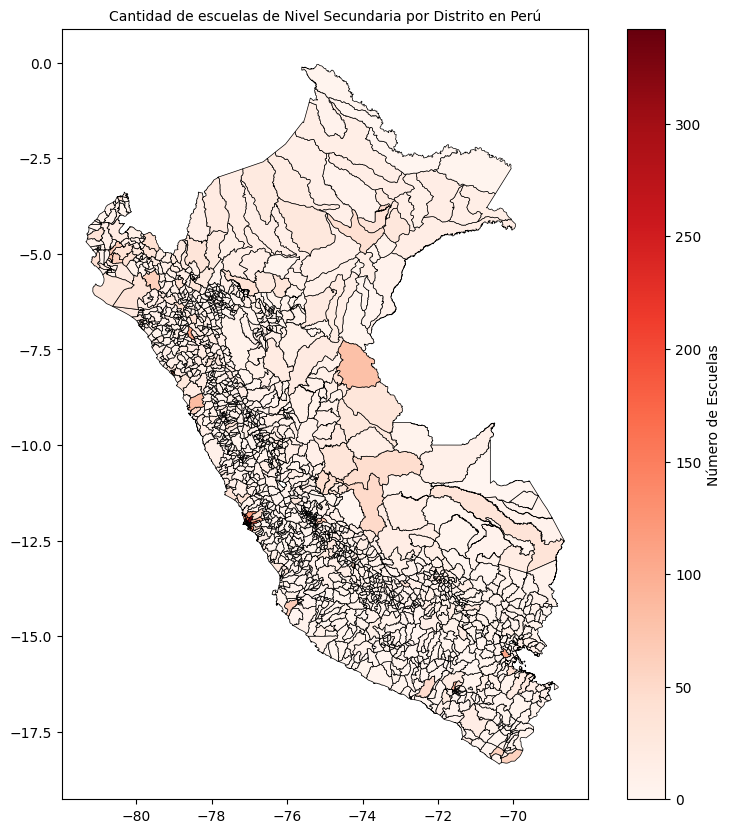

In [17]:
fig, ax = plt.subplots(figsize=(10, 10))

dpt_secundaria.plot(
    column='NumEscuelas',
    cmap='Reds',
    ax=ax,
    legend=True,
    edgecolor='black',
    linewidth=0.5,
    legend_kwds={'label': "Número de Escuelas"}
)

plt.title('Cantidad de escuelas de Nivel Secundaria por Distrito en Perú', fontsize=10)
plt.show()

# NOTA: SEGUNDA PARTE - mapa interactivo de Huancavelica(09) y Ayacucho (05)

In [18]:
import matplotlib.pyplot as plt
# Asegurar que los códigos UBIGEO están como strings para aplicar startswith
gdf_schools['IDDIST'] = gdf_schools['IDDIST'].astype(str)
dpt_shp['IDDIST'] = dpt_shp['IDDIST'].astype(str)

final_df_aya = gdf_schools[gdf_schools['Departamento'].str.strip().str.upper() == 'AYACUCHO']
final_df_hvc = gdf_schools[gdf_schools['Departamento'].str.strip().str.upper() == 'HUANCAVELICA']
print(final_df_hvc['IDDIST'].unique())

['90101' '90102' '90103' '90104' '90105' '90106' '90107' '90108' '90109'
 '90110' '90111' '90112' '90113' '90114' '90115' '90116' '90117' '90118'
 '90119' '90201' '90202' '90203' '90204' '90205' '90206' '90207' '90208'
 '90301' '90302' '90303' '90304' '90305' '90306' '90307' '90308' '90309'
 '90310' '90311' '90312' '90401' '90402' '90403' '90404' '90405' '90406'
 '90407' '90408' '90409' '90410' '90411' '90412' '90413' '90501' '90502'
 '90503' '90504' '90505' '90506' '90507' '90508' '90509' '90510' '90511'
 '90601' '90602' '90603' '90604' '90605' '90606' '90607' '90608' '90609'
 '90610' '90611' '90612' '90613' '90614' '90615' '90616' '90701' '90702'
 '90703' '90704' '90705' '90706' '90707' '90709' '90710' '90711' '90713'
 '90714' '90715' '90716' '90717' '90718' '90719' '90720' '90721' '90722'
 '90723' '90724' '90725']


In [19]:
print(final_df_aya)

       Código Modular        Nombre de SS.EE. IDDIST Departamento  \
85717         3000767            LICEO SCHOOL  50101     AYACUCHO   
85718         3000775            LICEO SCHOOL  50101     AYACUCHO   
85719         1346352  39003 CORAZON DE JESUS  50101     AYACUCHO   
85720          422204  39003 CORAZON DE JESUS  50101     AYACUCHO   
85721         1345768                HUAMANGA  50101     AYACUCHO   
...               ...                     ...    ...          ...   
89625         1350966    SAN ANTONIO DE PADUA  51108     AYACUCHO   
89626          421891                      25  51108     AYACUCHO   
89627          423152                   38170  51108     AYACUCHO   
89628          424655  VICTOR ANDRES BELAUNDE  51108     AYACUCHO   
89629          533620               VISCHONGO  51108     AYACUCHO   

           Provincia   DISTRITO  Centro Poblado  \
85717       HUAMANGA   AYACUCHO     11 DE JUNIO   
85718       HUAMANGA   AYACUCHO     11 DE JUNIO   
85719       HUAMAN

In [20]:
print(gdf_schools)

        Código Modular           Nombre de SS.EE.  IDDIST Departamento  \
0              3947725        SEMILLITAS DE JESUS   20101       ANCASH   
1               723718                      420-3   20101       ANCASH   
2              1406321              MAGNUS SCHOOL   20101       ANCASH   
3              1344944              MAGNUS SCHOOL   20101       ANCASH   
4              1310309                SANTA ELENA   20101       ANCASH   
...                ...                        ...     ...          ...   
114914         1451350                      32292  101108      HUANUCO   
114915          609768                      32878  101108      HUANUCO   
114916         1593128                        644  101108      HUANUCO   
114917         1177161                      33262  101108      HUANUCO   
114918         3980197  VISTA ALEGRE DE YURACYACU  101108      HUANUCO   

        Provincia DISTRITO             Centro Poblado  \
0          HUARAZ   HUARAZ             8 DE DICIEMBRE 

In [38]:
maps_hvc= dpt_shp[dpt_shp['IDDPTO'] == '09']
maps_hvc_DF = maps_hvc['IDDIST'].astype(str).str[7:]
#print(maps_hvc['IDDIST'].astype(str).str[7:].unique())
maps_hvc_DF

254      
337      
338      
339      
348      
       ..
1840     
1844     
1853     
1854     
1857     
Name: IDDIST, Length: 100, dtype: object

In [32]:
def clasificar_nivel(nivel):
    if isinstance(nivel, str):
        if 'Inicial' in nivel:
            return 'Inicial'
        elif 'Primaria' in nivel:
            return 'Primaria'
        elif 'Secundaria' in nivel:
            return 'Secundaria'
    return None

final_df_aya['Nivel_Simple'] = final_df_aya['Nivel / Modalidad'].apply(clasificar_nivel)
final_df_hvc['Nivel_Simple'] = final_df_hvc['Nivel / Modalidad'].apply(clasificar_nivel)

C:\Users\oser\AppData\Local\Temp\ipykernel_24772\1559580584.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df_aya['Nivel_Simple'] = final_df_aya['Nivel / Modalidad'].apply(clasificar_nivel)
C:\Users\oser\AppData\Local\Temp\ipykernel_24772\1559580584.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df_hvc['Nivel_Simple'] = final_df_hvc['Nivel / Modalidad'].apply(clasificar_nivel)


In [37]:
final_df_aya['Nivel_Simple']
final_df_hvc['Nivel_Simple']


107151       Inicial
107152      Primaria
107153       Inicial
107154    Secundaria
107155       Inicial
             ...    
110442    Secundaria
110443       Inicial
110444      Primaria
110445    Secundaria
110446       Inicial
Name: Nivel_Simple, Length: 3296, dtype: object

# HUANCAVELICA

In [ ]:
#Convertir 'IDDIST' a string de 6 dígitos
maps_hvc_DF = maps_hvc['IDDIST'].astype(str).str.zfill(6)
maps_hvc_DF

254     090613
337     090507
338     090503
339     090705
348     090103
         ...  
1840    090719
1844    090718
1853    090721
1854    090722
1857    090723
Name: IDDIST, Length: 100, dtype: object

In [ ]:
#Darle formato adecuado
maps_hvc_DF = maps_hvc_DF.reset_index(drop =True)
maps_hvc_DF = pd.DataFrame(maps_hvc_DF)
maps_hvc_DF.columns = ['IDDIST']
maps_hvc_DF

#Convertir 'IDDIST' a string de 6 dígitos
final_df_hvc['IDDIST'] = final_df_hvc['IDDIST'].astype(str).str.zfill(6)
maps_hvc_DF['IDDIST'] = maps_hvc_DF['IDDIST'].astype(str).str.zfill(6)

#Clasificar niveles
def clasificar_nivel(nivel):
    if isinstance(nivel, str):
        if 'Inicial' in nivel:
            return 'Inicial'
        elif 'Primaria' in nivel:
            return 'Primaria'
        elif 'Secundaria' in nivel:
            return 'Secundaria'
    return 'Otro'

final_df_hvc['Nivel_Simple'] = final_df_hvc['Nivel / Modalidad'].apply(clasificar_nivel)

#Contar colegios por distrito y nivel
conteo = (
    final_df_hvc.groupby(['IDDIST', 'Nivel_Simple'])
    .size()
    .reset_index(name='Cantidad')
)

#Pivotear para que cada nivel sea una columna 
conteo_pivot = conteo.pivot(index='IDDIST', columns='Nivel_Simple', values='Cantidad').fillna(0).reset_index()

#Hacer merge con mapa
merged_df = maps_hvc_DF.merge(conteo_pivot, on='IDDIST', how='left')

#Rellenar valores nulos con 0
for col in ['Inicial', 'Primaria', 'Secundaria']:
    if col not in merged_df.columns:
        merged_df[col] = 0
    else:
        merged_df[col] = merged_df[col].fillna(0)


print(merged_df.head())


   IDDIST  Inicial  Otro  Primaria  Secundaria
0  090613     18.0   1.0      24.0         3.0
1  090507     30.0   1.0      20.0         7.0
2  090503     13.0   2.0      11.0         4.0
3  090705     45.0   2.0      38.0        14.0
4  090103     95.0   0.0      75.0        25.0


C:\Users\oser\AppData\Local\Temp\ipykernel_24772\2872070470.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df_hvc['IDDIST'] = final_df_hvc['IDDIST'].astype(str).str.zfill(6)
C:\Users\oser\AppData\Local\Temp\ipykernel_24772\2872070470.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df_hvc['Nivel_Simple'] = final_df_hvc['Nivel / Modalidad'].apply(clasificar_nivel)


In [ ]:
#Formato adecuado
maps_hvc['IDDIST'] = maps_hvc['IDDIST'].astype(str).str.zfill(6)
final_df_hvc['IDDIST'] = final_df_hvc['IDDIST'].astype(str).str.zfill(6)

#Clasificar niveles
def clasificar_nivel(nivel):
    if isinstance(nivel, str):
        if 'Inicial' in nivel:
            return 'Inicial'
        elif 'Primaria' in nivel:
            return 'Primaria'
        elif 'Secundaria' in nivel:
            return 'Secundaria'
    return 'Otro'

final_df_hvc['Nivel_Simple'] = final_df_hvc['Nivel / Modalidad'].apply(clasificar_nivel)

#Contar colegios por distrito y nivel
conteo = (
    final_df_hvc.groupby(['IDDIST', 'Nivel_Simple'])
    .size()
    .reset_index(name='Cantidad')
)

#Pivotear para niveles como columnas
conteo_pivot = conteo.pivot(index='IDDIST', columns='Nivel_Simple', values='Cantidad').fillna(0).reset_index()

#Merge con el shapefile (maps_hvc)
merged_map = maps_hvc.merge(conteo_pivot, on='IDDIST', how='left')

#Rellenar NaNs con 0 en los niveles 
for col in ['Inicial', 'Primaria', 'Secundaria']:
    if col not in merged_map.columns:
        merged_map[col] = 0
    else:
        merged_map[col] = merged_map[col].fillna(0)

#Función para graficar y guardar por separado 
def graficar_mapa_por_nivel(gdf, nivel, cmap_color, nombre_archivo):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    gdf.plot(
        column=nivel,
        cmap=cmap_color,
        linewidth=0.5,
        edgecolor='gray',
        legend=True,
        ax=ax
    )

    # Añadir etiquetas con números
    for idx, row in gdf.iterrows():
        if row[nivel] > 0:
            centroid = row['geometry'].centroid
            ax.annotate(
                text=str(int(row[nivel])),
                xy=(centroid.x, centroid.y),
                ha='center',
                fontsize=10,
                color='black'
            )

    ax.set_title(f'Cantidad de colegios de nivel {nivel}', fontsize=10)
    ax.axis('off')
    plt.tight_layout()
    plt.savefig(nombre_archivo, dpi=300)
    plt.close()

#Graficar para cada nivel
graficar_mapa_por_nivel(merged_map, 'Inicial', 'Blues', 'Huancavelica_inicial.png')
graficar_mapa_por_nivel(merged_map, 'Primaria', 'Oranges', 'Huancavelica_primaria.png')
graficar_mapa_por_nivel(merged_map, 'Secundaria', 'Reds', 'Huancavelica_secundaria.png')


d:\Downloads\anaconda\envs\myenv\Lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\oser\AppData\Local\Temp\ipykernel_24772\2766795867.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df_hvc['IDDIST'] = final_df_hvc['IDDIST'].astype(str).str.zfill(6)
C:\Users\oser\AppData\Local\Temp\ipykernel_24772\2766795867.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usi

# GRÁFICO DE MAPAS: HUANCAVELICA

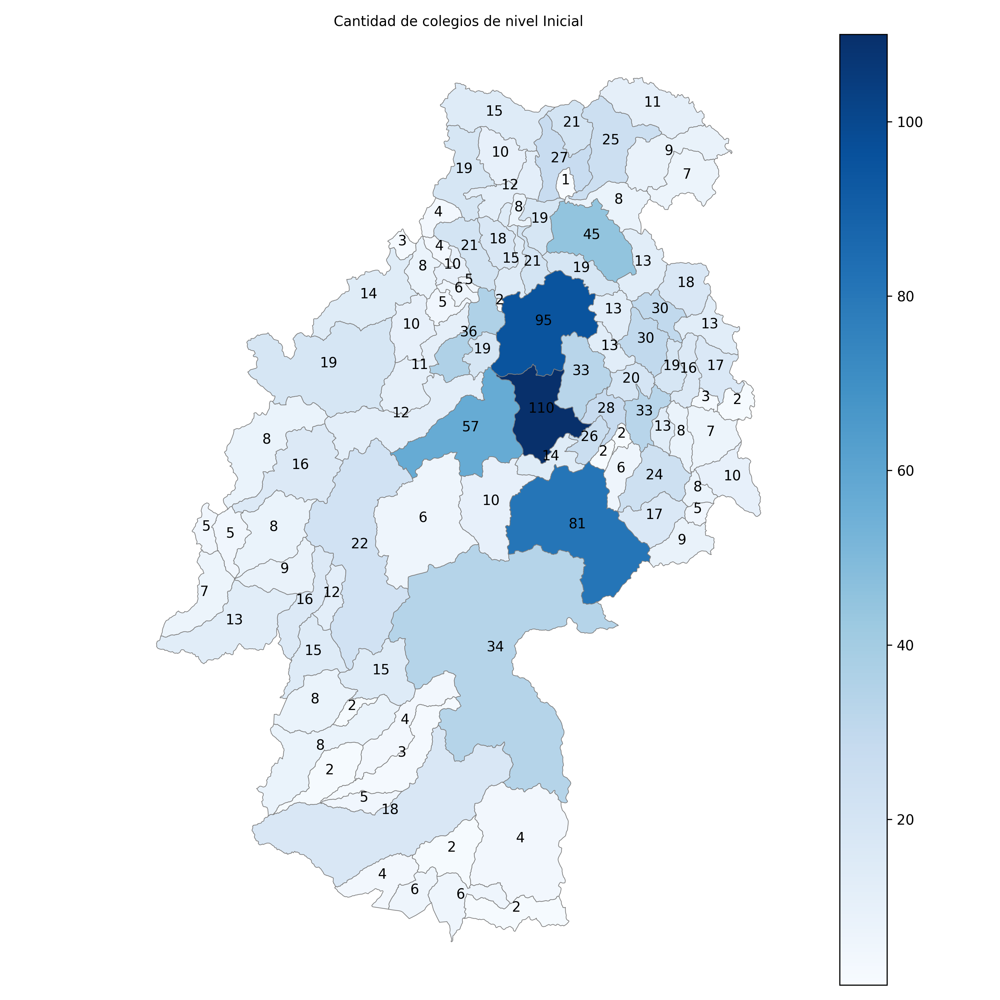

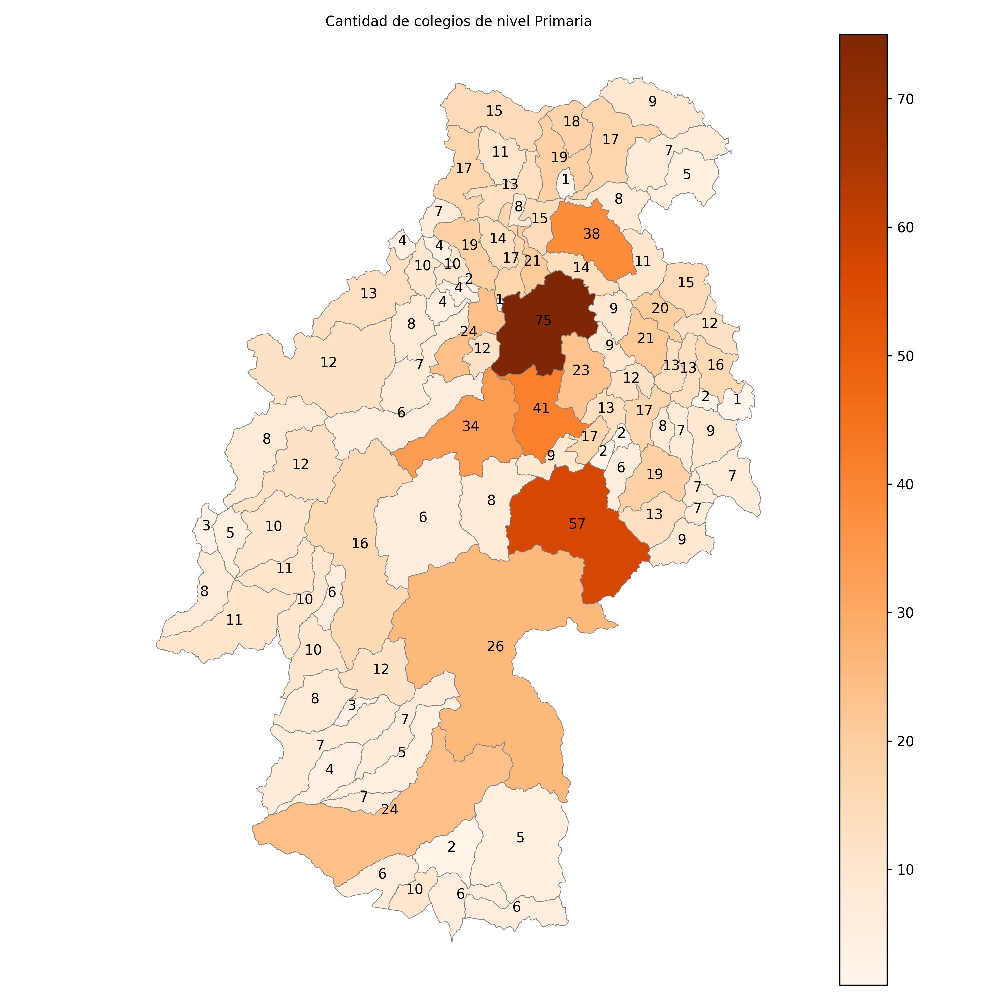

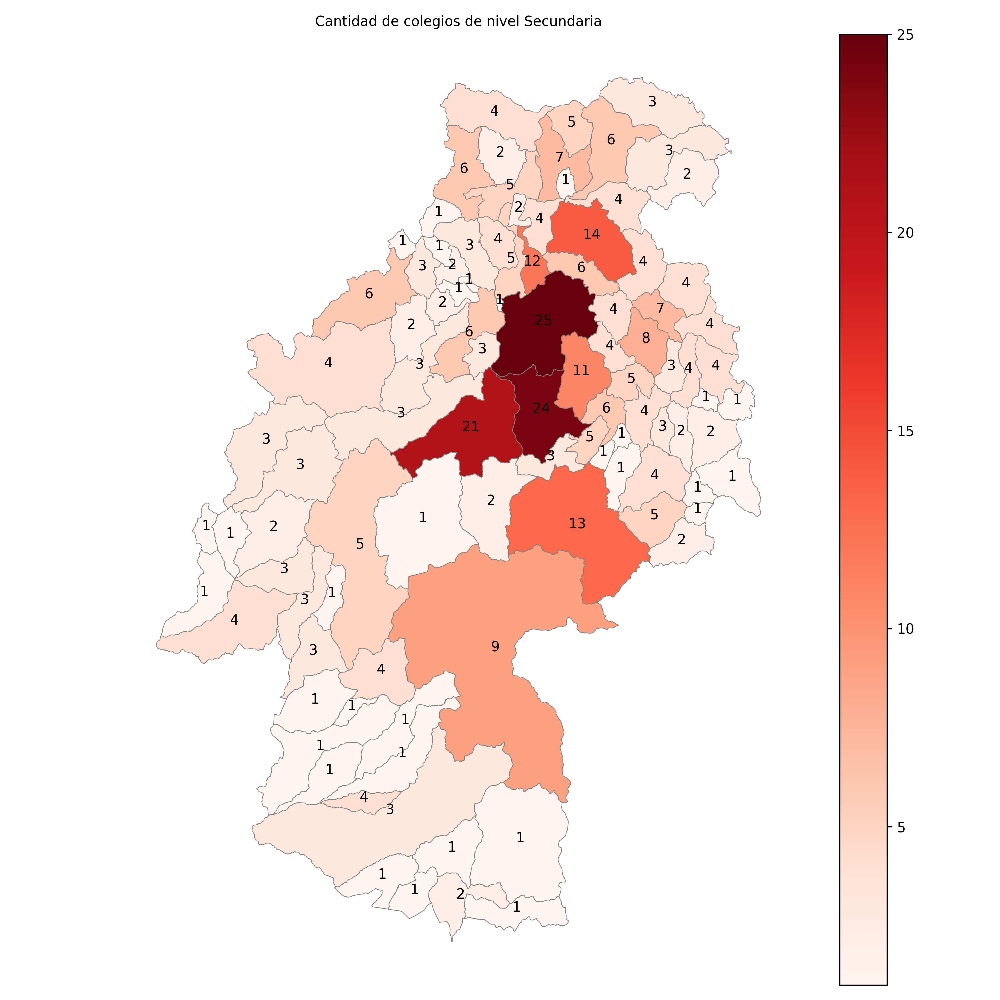

In [46]:
from IPython.display import Image, display

display(Image('Huancavelica_inicial.png'))
display(Image('Huancavelica_primaria.png'))
display(Image('Huancavelica_secundaria.png'))

# AYACUCHO

In [54]:
final_df_aya['Nivel_Simple']

85717       Inicial
85718      Primaria
85719    Secundaria
85720      Primaria
85721          Otro
            ...    
89625    Secundaria
89626       Inicial
89627      Primaria
89628    Secundaria
89629          Otro
Name: Nivel_Simple, Length: 3913, dtype: object

In [50]:
maps_aya= dpt_shp[dpt_shp['IDDPTO'] == '05']
maps_aya_DF = maps_hvc['IDDIST'].astype(str).str[7:]
maps_aya_DF

254      
337      
338      
339      
348      
       ..
1840     
1844     
1853     
1854     
1857     
Name: IDDIST, Length: 100, dtype: object

In [65]:
#se repite el procedimiento realizado para HUANCAVELICA

maps_aya_DF = maps_aya[['IDDIST']].copy().reset_index(drop=True)
maps_aya_DF.columns = ['IDDIST']

# Convertir 'Ubigeo' a string de 6 dígitos
final_df_aya['IDDIST'] = final_df_aya['IDDIST'].astype(str).str.zfill(6)
maps_aya_DF['IDDIST'] = maps_aya_DF['IDDIST'].astype(str).str.zfill(6)

# ---------- 2. Clasificar niveles ----------
def clasificar_nivel(nivel):
    if isinstance(nivel, str):
        if 'Inicial' in nivel:
            return 'Inicial'
        elif 'Primaria' in nivel:
            return 'Primaria'
        elif 'Secundaria' in nivel:
            return 'Secundaria'
    return 'Otro'

final_df_aya['Nivel_Simple'] = final_df_aya['Nivel / Modalidad'].apply(clasificar_nivel)

# ---------- 3. Contar colegios por distrito y nivel ----------
conteo = (
    final_df_aya.groupby(['IDDIST', 'Nivel_Simple'])
    .size()
    .reset_index(name='Cantidad')
)

# ---------- 4. Pivotear para que cada nivel sea una columna ----------
conteo_pivot = conteo.pivot(index='IDDIST', columns='Nivel_Simple', values='Cantidad').fillna(0).reset_index()

# ---------- 5. Hacer merge con mapa ----------
merged_df = maps_aya.merge(conteo_pivot, left_on='IDDIST', right_on='IDDIST', how='left')

# ---------- 6. Rellenar valores nulos con 0 ----------
for col in ['Inicial', 'Primaria', 'Secundaria']:
    if col not in merged_df.columns:
        merged_df[col] = 0
    else:
        merged_df[col] = merged_df[col].fillna(0)

# ---------- 7. Verificar resultado ----------
print(merged_df[['IDDIST', 'DISTRITO', 'Inicial', 'Primaria', 'Secundaria']].head())



   IDDIST      DISTRITO  Inicial  Primaria  Secundaria
0  050404        IGUAIN      8.0       7.0         2.0
1  050403  HUAMANGUILLA     12.0       9.0         3.0
2  050508         TAMBO     35.0      27.0         9.0
3  050511      ORONCCOY     10.0      11.0         6.0
4  050407         SIVIA     40.0      41.0        15.0


C:\Users\oser\AppData\Local\Temp\ipykernel_24772\2764596956.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df_aya['IDDIST'] = final_df_aya['IDDIST'].astype(str).str.zfill(6)
C:\Users\oser\AppData\Local\Temp\ipykernel_24772\2764596956.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df_aya['Nivel_Simple'] = final_df_aya['Nivel / Modalidad'].apply(clasificar_nivel)


In [60]:

maps_aya['IDDIST'] = maps_aya['IDDIST'].astype(str).str.zfill(6)
final_df_aya['IDDIST'] = final_df_aya['IDDIST'].astype(str).str.zfill(6)

def clasificar_nivel(nivel):
    if isinstance(nivel, str):
        if 'Inicial' in nivel:
            return 'Inicial'
        elif 'Primaria' in nivel:
            return 'Primaria'
        elif 'Secundaria' in nivel:
            return 'Secundaria'
    return 'Otro'

final_df_aya['Nivel_Simple'] = final_df_aya['Nivel / Modalidad'].apply(clasificar_nivel)

#Contar colegios por distrito y nivel
conteo = (
    final_df_aya.groupby(['IDDIST', 'Nivel_Simple'])
    .size()
    .reset_index(name='Cantidad')
)

#Pivotear
conteo_pivot = conteo.pivot(index='IDDIST', columns='Nivel_Simple', values='Cantidad').fillna(0).reset_index()

#Merge
merged_map = maps_aya.merge(conteo_pivot, on='IDDIST', how='left')

for col in ['Inicial', 'Primaria', 'Secundaria']:
    if col not in merged_map.columns:
        merged_map[col] = 0
    else:
        merged_map[col] = merged_map[col].fillna(0)

#Función para graficar y guardar por separado 
def graficar_mapa_por_nivel(gdf, nivel, cmap_color, nombre_archivo):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    gdf.plot(
        column=nivel,
        cmap=cmap_color,
        linewidth=0.5,
        edgecolor='gray',
        legend=True,
        ax=ax
    )

    #Etiquetas
    for idx, row in gdf.iterrows():
        if row[nivel] > 0:
            centroid = row['geometry'].centroid
            ax.annotate(
                text=str(int(row[nivel])),
                xy=(centroid.x, centroid.y),
                ha='center',
                fontsize=10,
                color='black'
            )

    ax.set_title(f'Distribución de colegios de nivel {nivel} - Ayacucho', fontsize=10)
    ax.axis('off')
    plt.tight_layout()
    plt.savefig(nombre_archivo, dpi=300)
    plt.close()


graficar_mapa_por_nivel(merged_map, 'Inicial', 'Purples', 'ayacucho_inicial.png')
graficar_mapa_por_nivel(merged_map, 'Primaria', 'Greens', 'ayacucho_primaria.png')
graficar_mapa_por_nivel(merged_map, 'Secundaria', 'Oranges', 'ayacucho_secundaria.png')

d:\Downloads\anaconda\envs\myenv\Lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\oser\AppData\Local\Temp\ipykernel_24772\1552421469.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df_aya['IDDIST'] = final_df_aya['IDDIST'].astype(str).str.zfill(6)
C:\Users\oser\AppData\Local\Temp\ipykernel_24772\1552421469.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usi

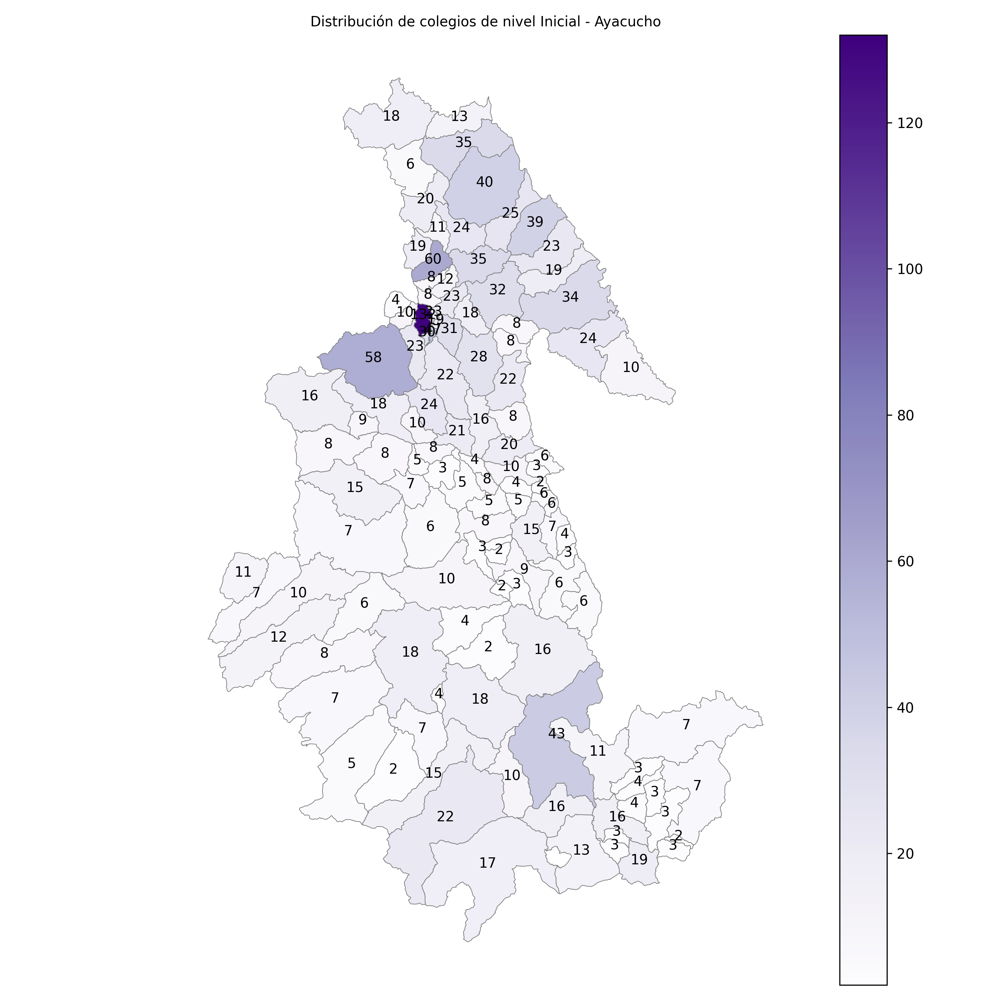

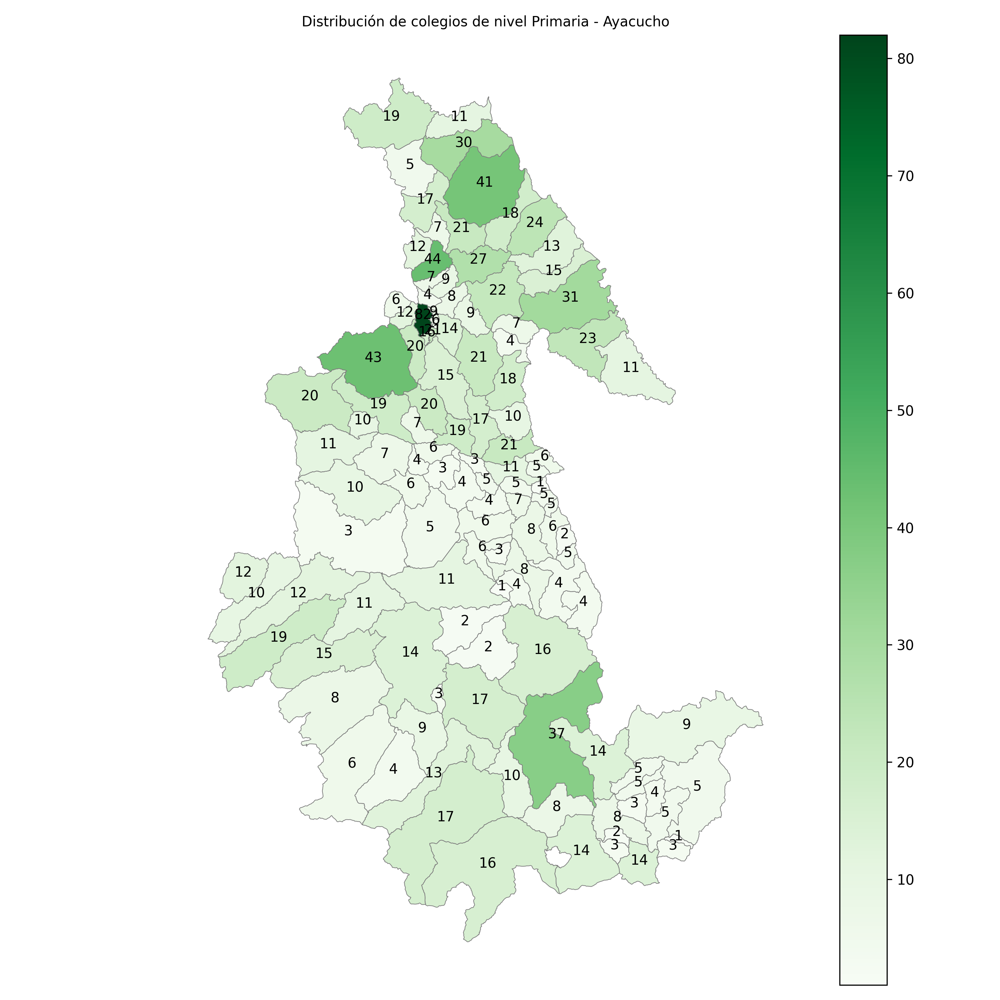

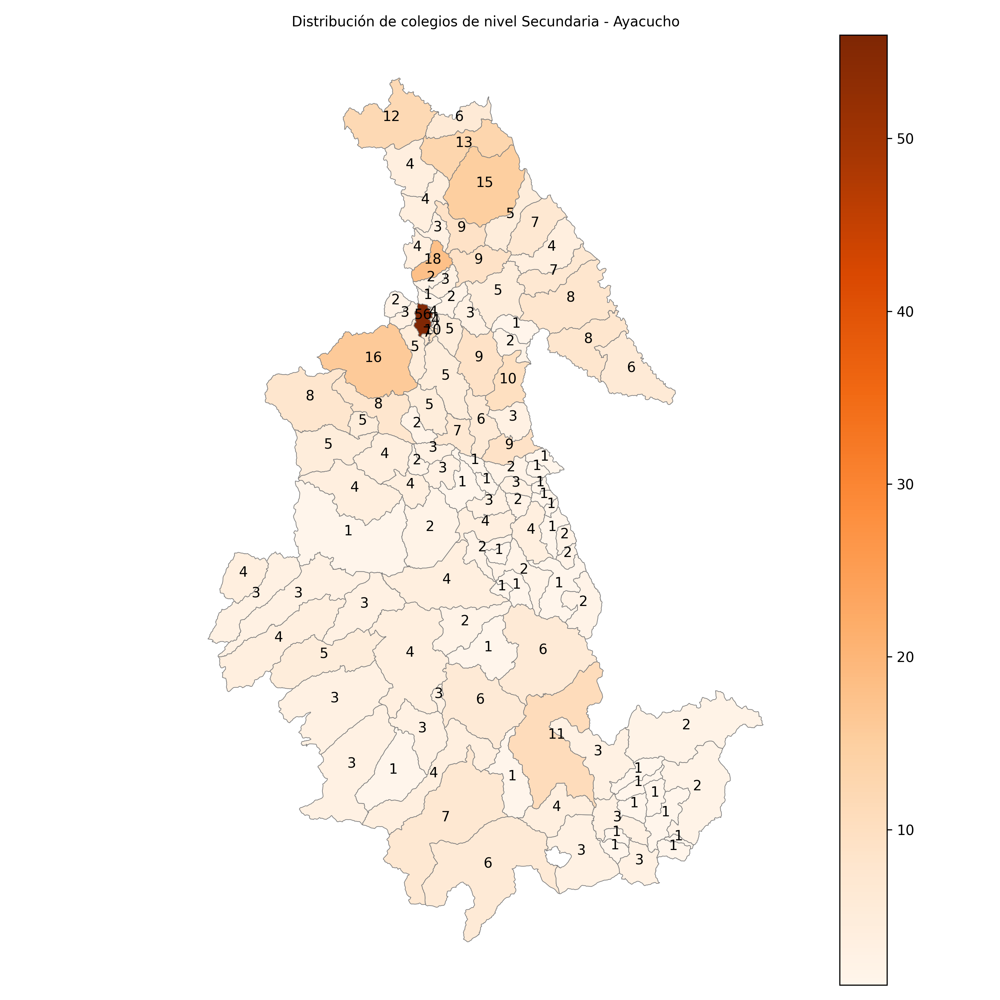

In [66]:
display(Image('ayacucho_inicial.png'))
display(Image('ayacucho_primaria.png'))
display(Image('ayacucho_secundaria.png'))

In [70]:
# Concatenar
merged_df_aya = merged_df[['IDDIST', 'DISTRITO', 'Inicial', 'Primaria', 'Secundaria']]
merged_df_aya['Departamento'] = 'Ayacucho'

#MERGE
merged_df_hvc = merged_df[['IDDIST', 'DISTRITO', 'Inicial', 'Primaria', 'Secundaria']]
merged_df_hvc['Departamento'] = 'Huancavelica'

#UNIR DATAFRAMES
df_total = pd.concat([merged_df_aya, merged_df_hvc], ignore_index=True)

#Graficar
def graficar_barplot(df, departamento, nivel, color, archivo_salida):
    df_plot = df[(df['Departamento'] == departamento) & (df[nivel] > 0)]
    df_plot = df_plot.sort_values(by=nivel, ascending=False)
    
    plt.figure(figsize=(10, 5))
    plt.bar(df_plot['DISTRITO'], df_plot[nivel], color=color)
    plt.xlabel('Distrito')
    plt.ylabel('Cantidad de Escuelas')
    plt.title(f'{departamento} - Nivel {nivel}')
    plt.xticks(rotation=90, fontsize=10)
    plt.tight_layout()
    plt.savefig(archivo_salida, dpi=300)
    plt.close()

#Ejecutar para cada nivel y departamento
niveles = ['Inicial', 'Primaria', 'Secundaria']
colores = ['red', 'blue', 'green']

#Ayacucho
for nivel, color in zip(niveles, colores):
    graficar_barplot(df_total, 'AYACUCHO', nivel, color, f'barplot_ayacucho_{nivel.lower()}.png')

#Huancavelica
for nivel, color in zip(niveles, colores):
    graficar_barplot(df_total, 'HUANCAVELICA', nivel, color, f'barplot_huancavelica_{nivel.lower()}.png')



C:\Users\oser\AppData\Local\Temp\ipykernel_24772\784363088.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df_aya['Departamento'] = 'Ayacucho'
C:\Users\oser\AppData\Local\Temp\ipykernel_24772\784363088.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df_hvc['Departamento'] = 'Huancavelica'


In [71]:
#AYACUCHO
conteo_aya = (
    final_df_aya.groupby(['IDDIST', 'Nivel_Simple'])
    .size()
    .reset_index(name='Cantidad')
)
pivot_aya = (
    conteo_aya
    .pivot(index='IDDIST', columns='Nivel_Simple', values='Cantidad')
    .fillna(0)
    .reset_index()
)
merged_aya = maps_aya.merge(pivot_aya, left_on='IDDIST', right_on='IDDIST', how='left')
for lvl in ['Inicial', 'Primaria', 'Secundaria']:
    merged_aya[lvl] = merged_aya.get(lvl, 0).fillna(0)

#HUANCAVELICA
conteo_hvc = (
    final_df_hvc.groupby(['IDDIST', 'Nivel_Simple'])
    .size()
    .reset_index(name='Cantidad')
)
pivot_hvc = (
    conteo_hvc
    .pivot(index='IDDIST', columns='Nivel_Simple', values='Cantidad')
    .fillna(0)
    .reset_index()
)
merged_hvc = maps_hvc.merge(pivot_hvc, left_on='IDDIST', right_on='IDDIST', how='left')
for lvl in ['Inicial', 'Primaria', 'Secundaria']:
    merged_hvc[lvl] = merged_hvc.get(lvl, 0).fillna(0)


#Función para graficar barplot de un departamento y nivel

def graficar_barplot_territorio(merged_gdf, distrito_col, nivel, color, archivo_salida):
    # Extraer solo distritos con >0 escuelas de ese nivel
    df_plot = merged_gdf.loc[merged_gdf[nivel] > 0, [distrito_col, nivel]]
    df_plot = df_plot.sort_values(by=nivel, ascending=False)
    
    plt.figure(figsize=(12, 6))
    plt.bar(df_plot[distrito_col], df_plot[nivel], color=color)
    plt.xlabel('Distrito')
    plt.ylabel('Cantidad de Escuelas')
    plt.title(f'{nivel} por Distrito')
    plt.xticks(rotation=90, fontsize=8)
    plt.tight_layout()
    plt.savefig(archivo_salida, dpi=300)
    plt.close()




In [72]:
#GRAFICO AYACUCHO
for nivel, color in zip(['Inicial', 'Primaria', 'Secundaria'], ['red', 'blue', 'green']):
    archivo = f'barplot1_ayacucho_{nivel.lower()}.png'
    graficar_barplot_territorio(
        merged_aya, 
        distrito_col='DISTRITO', 
        nivel=nivel, 
        color=color, 
        archivo_salida=archivo
    )


In [73]:
#GRAFICO HUANCAVELICA

for nivel, color in zip(['Inicial', 'Primaria', 'Secundaria'], ['red', 'blue', 'green']):
    archivo = f'barplot1_huancavelica_{nivel.lower()}.png'
    graficar_barplot_territorio(
        merged_hvc, 
        distrito_col='DISTRITO', 
        nivel=nivel, 
        color=color, 
        archivo_salida=archivo
    )


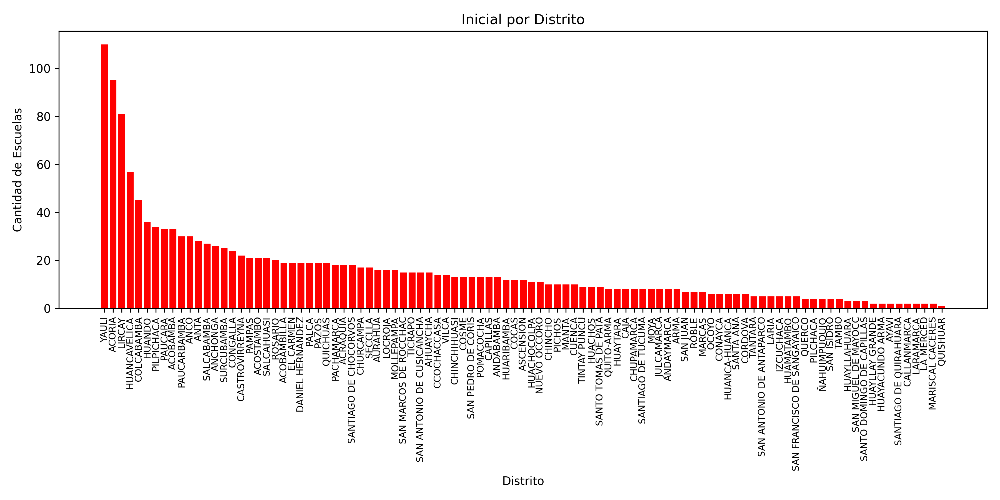

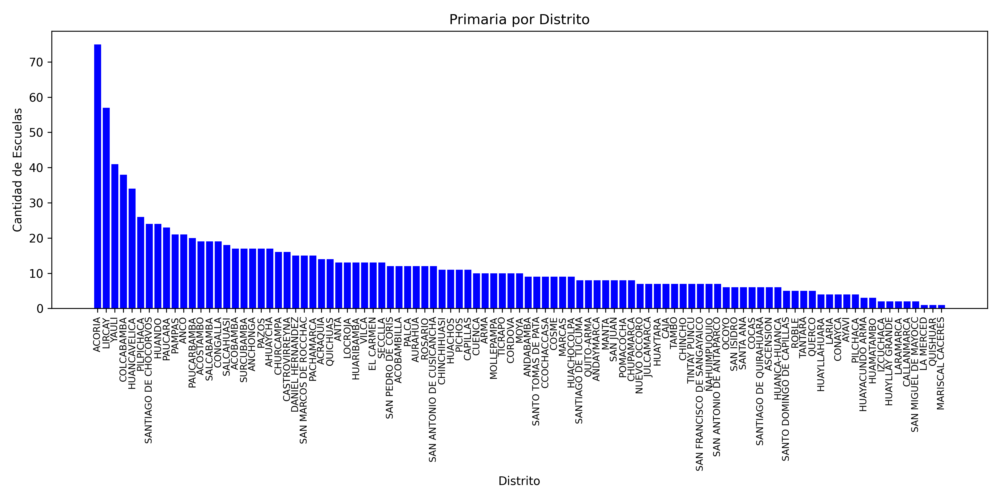

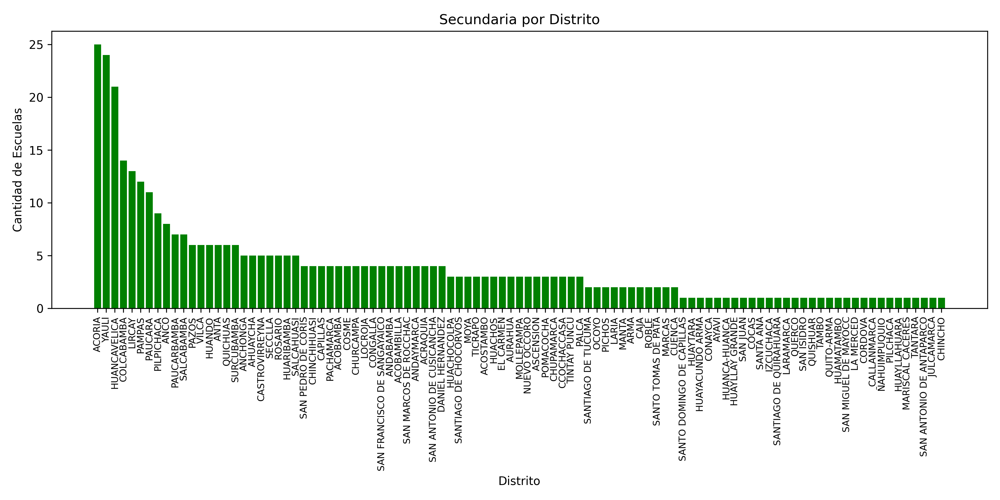

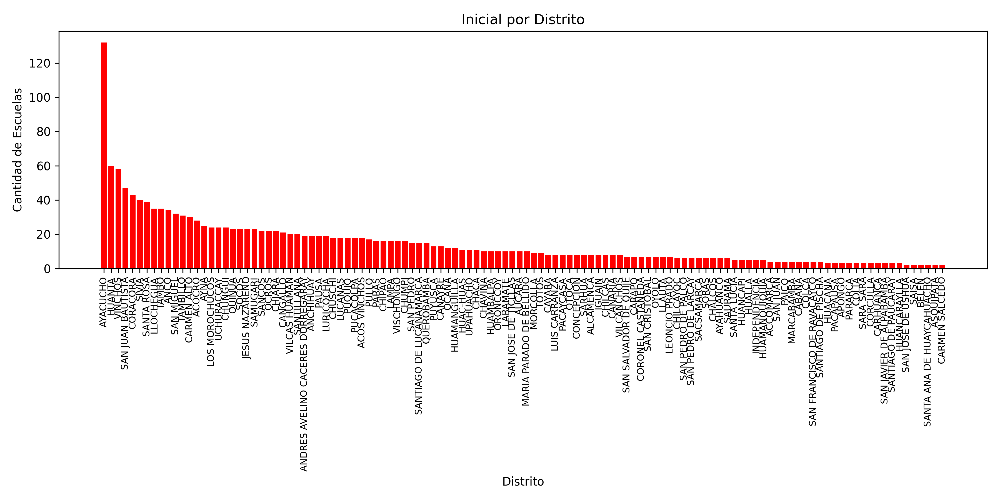

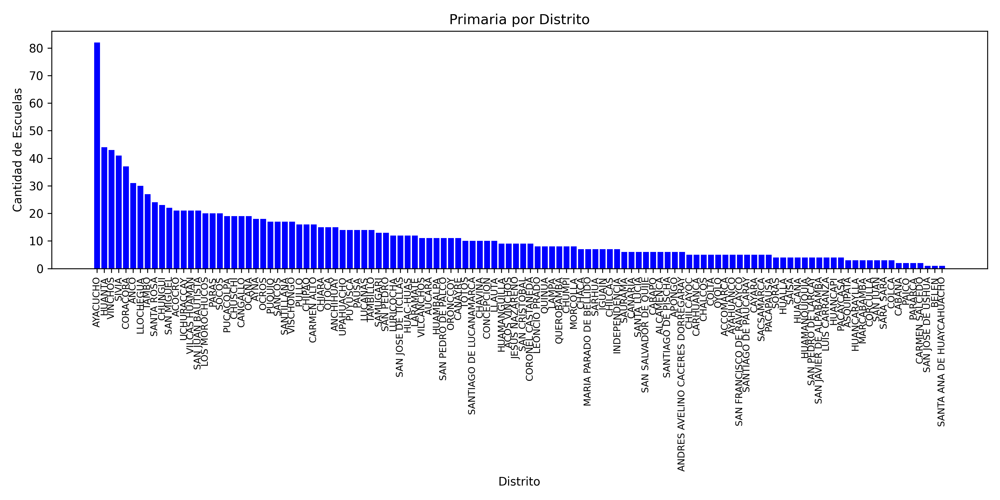

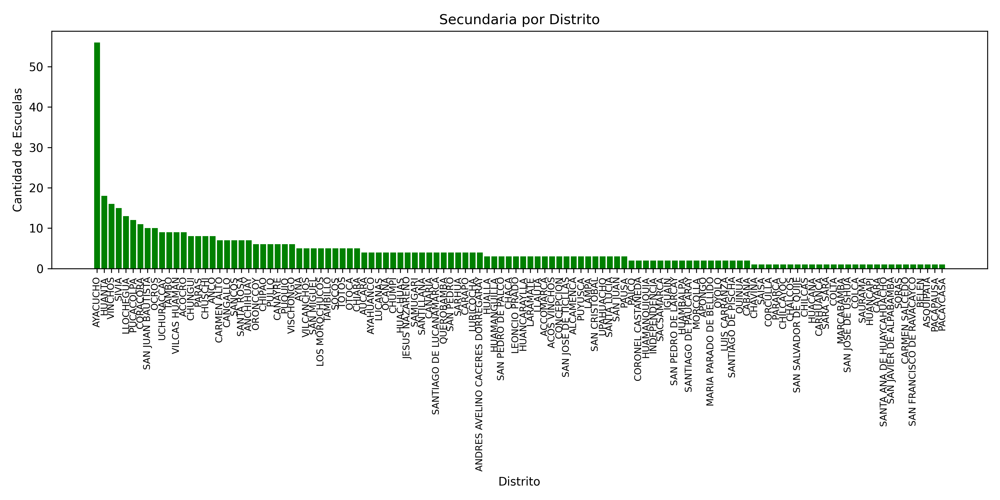

In [74]:
display(Image('barplot1_huancavelica_inicial.png'))
display(Image('barplot1_huancavelica_primaria.png'))
display(Image('barplot1_huancavelica_secundaria.png'))
display(Image('barplot1_ayacucho_inicial.png'))
display(Image('barplot1_ayacucho_primaria.png'))
display(Image('barplot1_ayacucho_secundaria.png'))

# TEST DE PROXIMIDAD


In [78]:
print(final_df.columns)

Index(['Código Modular', 'Nombre de SS.EE.', 'Ubigeo', 'Departamento',
       'Provincia', 'Distrito', 'Centro Poblado', 'Nivel / Modalidad',
       'Gestion / Dependencia'],
      dtype='object')
